# Exploratory Temporal Analysis

*Marcos Martínez*

---

Exploratory analysis of the temporal behavior of Networld

## 1. Setup

***Module Import***

In [4]:
import os
import networkx as nx
import matplotlib.pyplot as plt

from scipy.stats import entropy
from sklearn.preprocessing import MinMaxScaler

from matlab_utils import *

***Load Data***

In [2]:
data_path = '../data/'
data_files = os.listdir(data_path)
data_files = [file for file in data_files if file[:3]=='N40' and file[-7:]=='alt.mat']

In [3]:
data = {}

for file in data_files:
    beta = file.split('_')[1]
    beta = float(beta[4:])
    file = data_path + file
    sim_data = load_processed_networld(file)
    meas_data = sim_data['Networks_Time'].merge(sim_data['Networks_Measures'], how='left', on='NRed')
    if beta in data.keys():
        data[beta].append(meas_data)
    else:
        data[beta] = [meas_data]

## 2. Network Collapse

### 2.1. Temporal Evolution

#### 2.1.1 Analysis of trayectories

***Number of Networks***

In [2]:
num_net_data = {}

for i, beta in enumerate(sorted(data.keys())):
    beta_num_net = []
    for sim_data in data[beta]:
        num_net = sim_data.groupby('t')['NRep'].sum().reset_index()
        beta_num_net.append(num_net)
    num_net_data[beta] = beta_num_net

NameError: name 'data' is not defined

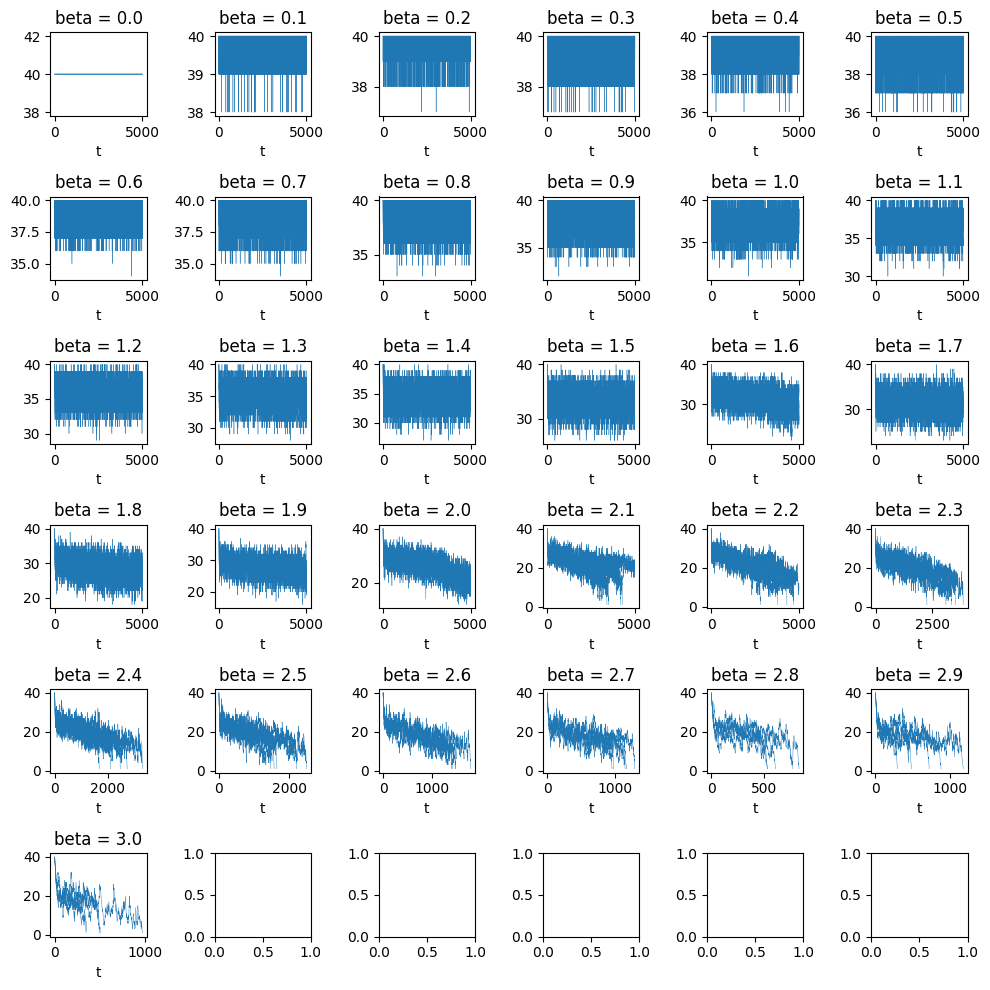

In [11]:
fig, axs = plt.subplots(6,6, figsize=(10,10))
axs = [ax for axlist in axs for ax in axlist]

for i, beta in enumerate(sorted(num_net_data.keys())):
    for num_net in num_net_data[beta]:
        num_net.plot(x='t', y='NRep', ax=axs[i], color='tab:blue', legend=False, lw=0.3)
        axs[i].set_title(f'beta = {beta}')
fig.tight_layout()

El nº de redes (componentes separadas) evoluciona como un proceso estocástico donde una beta mayor implica mayor tasa de decrecimiento y también menor ruido

Se pueden apreciar (sobre todo con beta alto) tres regímenes que corresponden a un descenso rápido inicial, un descenso lento durante la mayoría de la simulación y un descenso rápido final cuando se produce el colapso en una estructura (si se produce).

***Diversity of Networks***

Entropía (sin normalizar) de la distribucion de redes que hay en cada instante temporal (X repeticiones de la red 0, Y de la red 1, ...)

In [5]:
diversity_data = {}

for i, beta in enumerate(sorted(data.keys())):
    beta_diversity = []
    for sim_data in data[beta]:
        sim_data['NNet'] = sim_data.groupby('t')['NRep'].transform('sum')
        sim_data['p'] = sim_data['NRep'] / sim_data['NNet']
        diversity = sim_data.groupby('t')['p'].aggregate(entropy).reset_index()
        diversity.rename(columns={'p':'Diversity'}, inplace=True)
        beta_diversity.append(diversity)
    diversity_data[beta] = beta_diversity

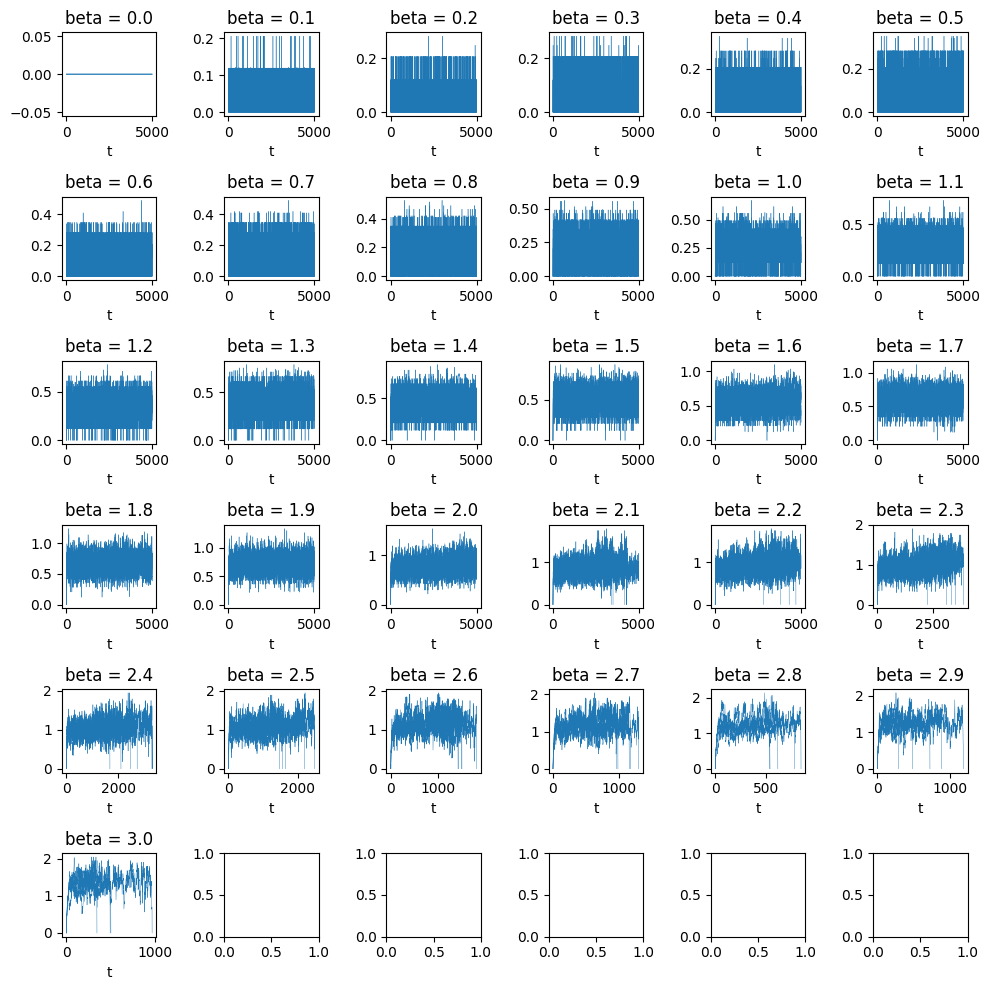

In [13]:
fig, axs = plt.subplots(6,6, figsize=(10,10))
axs = [ax for axlist in axs for ax in axlist]

for i, beta in enumerate(sorted(diversity_data.keys())):
    for diversity in diversity_data[beta]:
        diversity.plot(x='t', y='Diversity', ax=axs[i], color='tab:blue', legend=False, lw=0.3)
        axs[i].set_title(f'beta = {beta}')
fig.tight_layout()

La diversidad empieza siempre en 0 con nodos sueltos y despega rápidamente a un régimen aproximadamente estacionario. Cuando beta es suficientemente baja y se produce colapso a una estructura la entropía regresa a 0

***$\lambda_1$ of Networks***

In [6]:
lamb1_data = {}

for i, beta in enumerate(sorted(data.keys())):
    beta_lamb1 = []
    for sim_data in data[beta]:
        df_cp = sim_data[['t','NRep','Lamb1','NNet']].copy()
        df_cp['Lamb1'] = df_cp['Lamb1']*df_cp['NRep'] / df_cp['NNet']
        lamb1 = df_cp.groupby('t')['Lamb1'].sum().reset_index()
        beta_lamb1.append(lamb1)
    lamb1_data[beta] = beta_lamb1

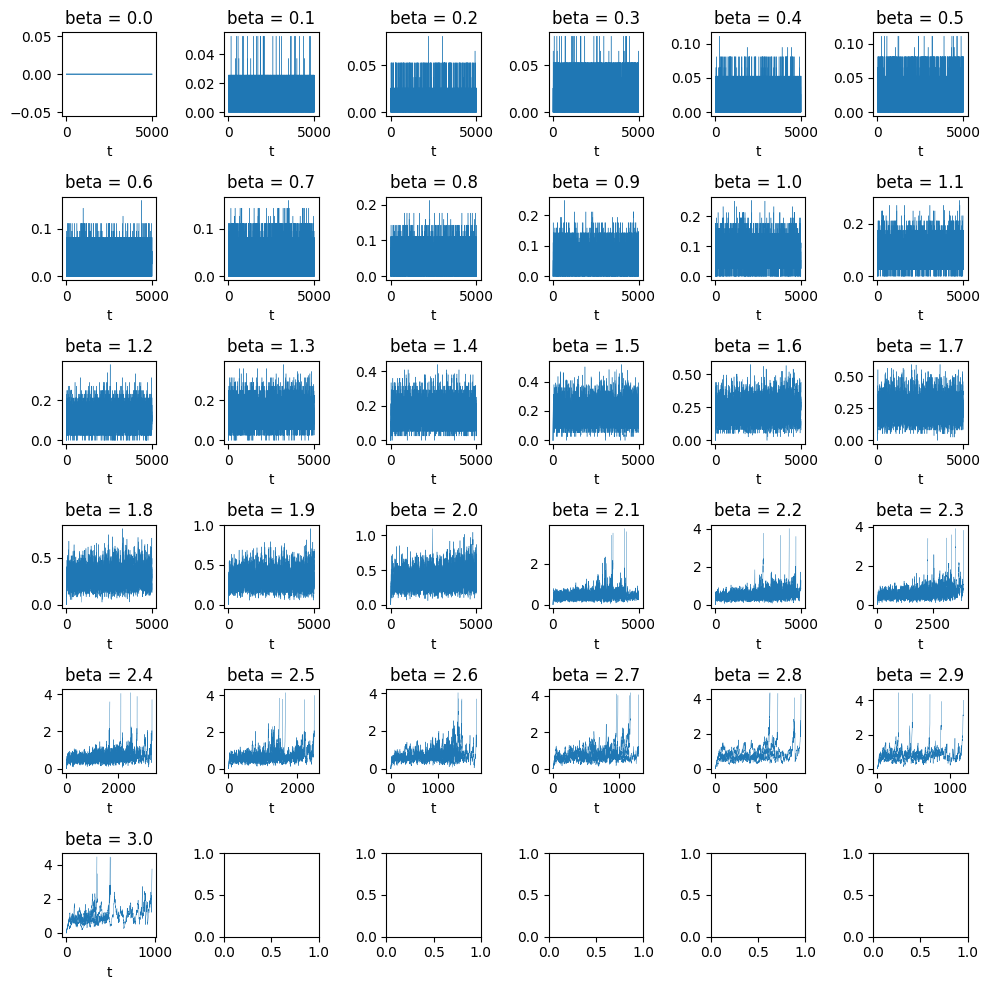

In [15]:
fig, axs = plt.subplots(6,6, figsize=(10,10))
axs = [ax for axlist in axs for ax in axlist]

for i, beta in enumerate(sorted(lamb1_data.keys())):
    for lamb1 in lamb1_data[beta]:
        lamb1.plot(x='t', y='Lamb1', ax=axs[i], color='tab:blue', legend=False, lw=0.3)
        axs[i].set_title(f'beta = {beta}')
fig.tight_layout()

Proceso estocastico que tiende al crecimiento. En este caso solo hay un regimen de crecimiento rápido cuando se produce el colapso a una estructura.

***$\lambda_2$ of Networks***

In [7]:
lamb2_data = {}

for i, beta in enumerate(sorted(data.keys())):
    beta_lamb2 = []
    for sim_data in data[beta]:
        df_cp = sim_data[['t','NRep','Lamb2','NNet']].copy()
        df_cp['Lamb2'] = df_cp['Lamb2']*df_cp['NRep'] / df_cp['NNet']
        lamb2 = df_cp.groupby('t')['Lamb2'].sum().reset_index()
        beta_lamb2.append(lamb2)
    lamb2_data[beta] = beta_lamb2

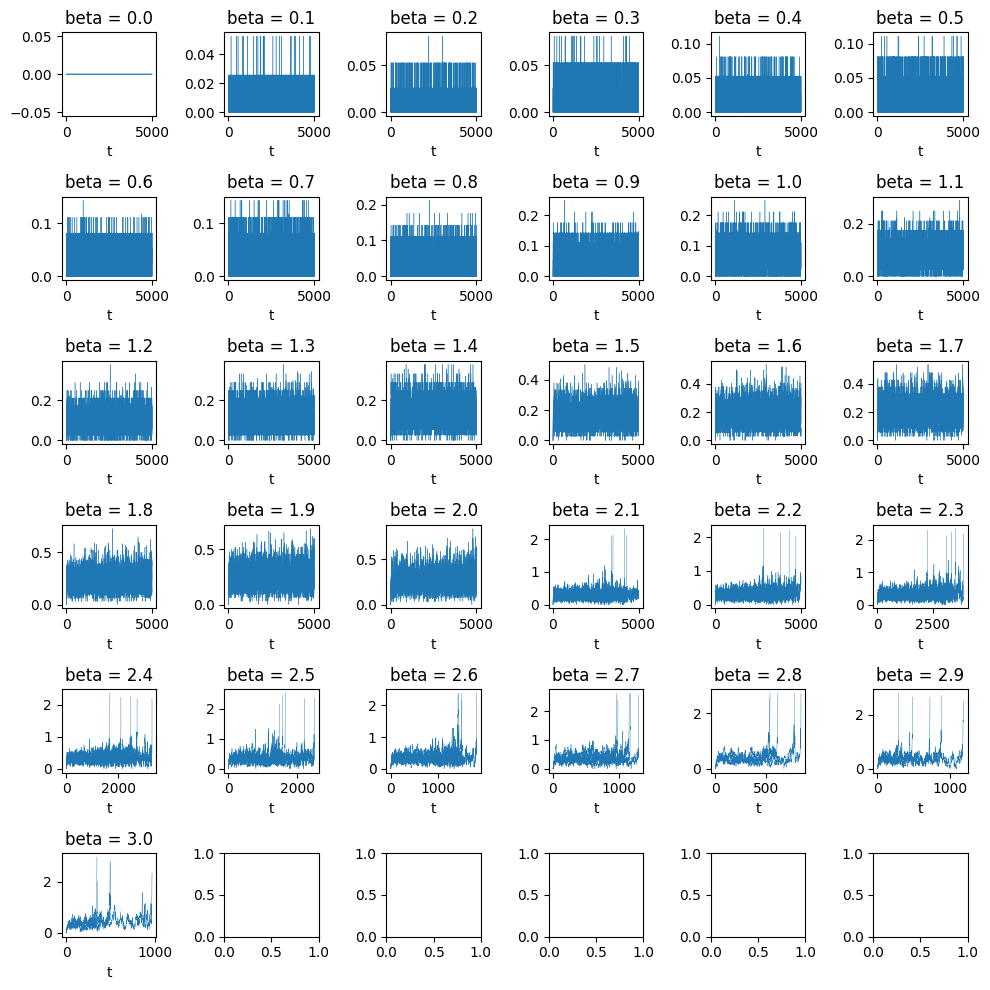

In [17]:
fig, axs = plt.subplots(6,6, figsize=(10,10))
axs = [ax for axlist in axs for ax in axlist]

for i, beta in enumerate(sorted(lamb2_data.keys())):
    for lamb2 in lamb2_data[beta]:
        lamb2.plot(x='t', y='Lamb2', ax=axs[i], color='tab:blue', legend=False, lw=0.3)
        axs[i].set_title(f'beta = {beta}')
fig.tight_layout()

Similar a Lambda 1

***H of Networks***

In [8]:
H_data = {}

for i, beta in enumerate(sorted(data.keys())):
    beta_H = []
    for sim_data in data[beta]:
        df_cp = sim_data[['t','NRep','H','NNet']].copy()
        df_cp['H'] = df_cp['H']*df_cp['NRep'] / df_cp['NNet']
        H = df_cp.groupby('t')['H'].sum().reset_index()
        beta_H.append(H)
    H_data[beta] = beta_H

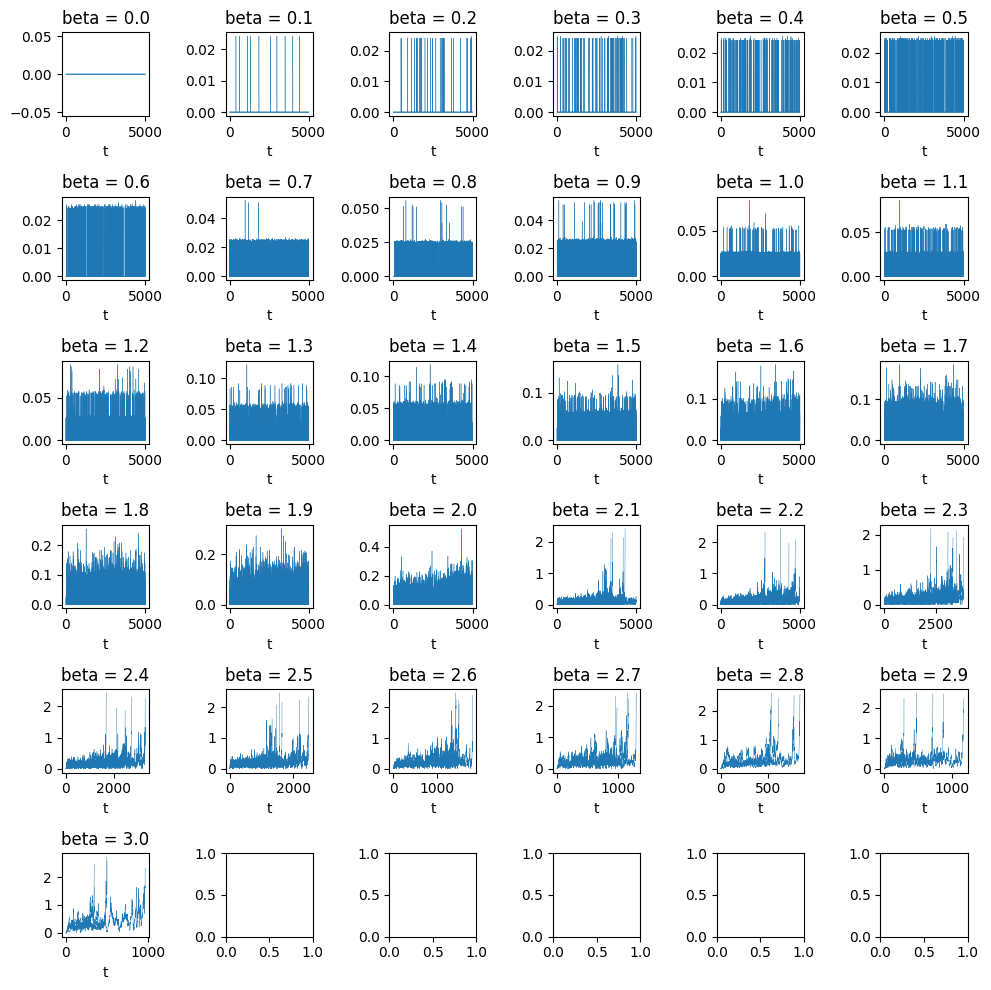

In [19]:
fig, axs = plt.subplots(6,6, figsize=(10,10))
axs = [ax for axlist in axs for ax in axlist]

for i, beta in enumerate(sorted(H_data.keys())):
    for H in H_data[beta]:
        H.plot(x='t', y='H', ax=axs[i], color='tab:blue', legend=False, lw=0.3)
        axs[i].set_title(f'beta = {beta}')
fig.tight_layout()

Similar a los Lambda

***Nº Links of Networks***

In [9]:
N_Links_data = {}

for i, beta in enumerate(sorted(data.keys())):
    beta_N_Links = []
    for sim_data in data[beta]:
        df_cp = sim_data[['t','NRep','GrMedio','NNet', 'N']].copy()
        df_cp['N_Links'] = df_cp['GrMedio'] * df_cp['N']
        df_cp['N_Links'] = df_cp['N_Links'] * df_cp['NRep']
        N_Links = df_cp.groupby('t')['N_Links'].sum().reset_index()
        beta_N_Links.append(N_Links)
    N_Links_data[beta] = beta_N_Links

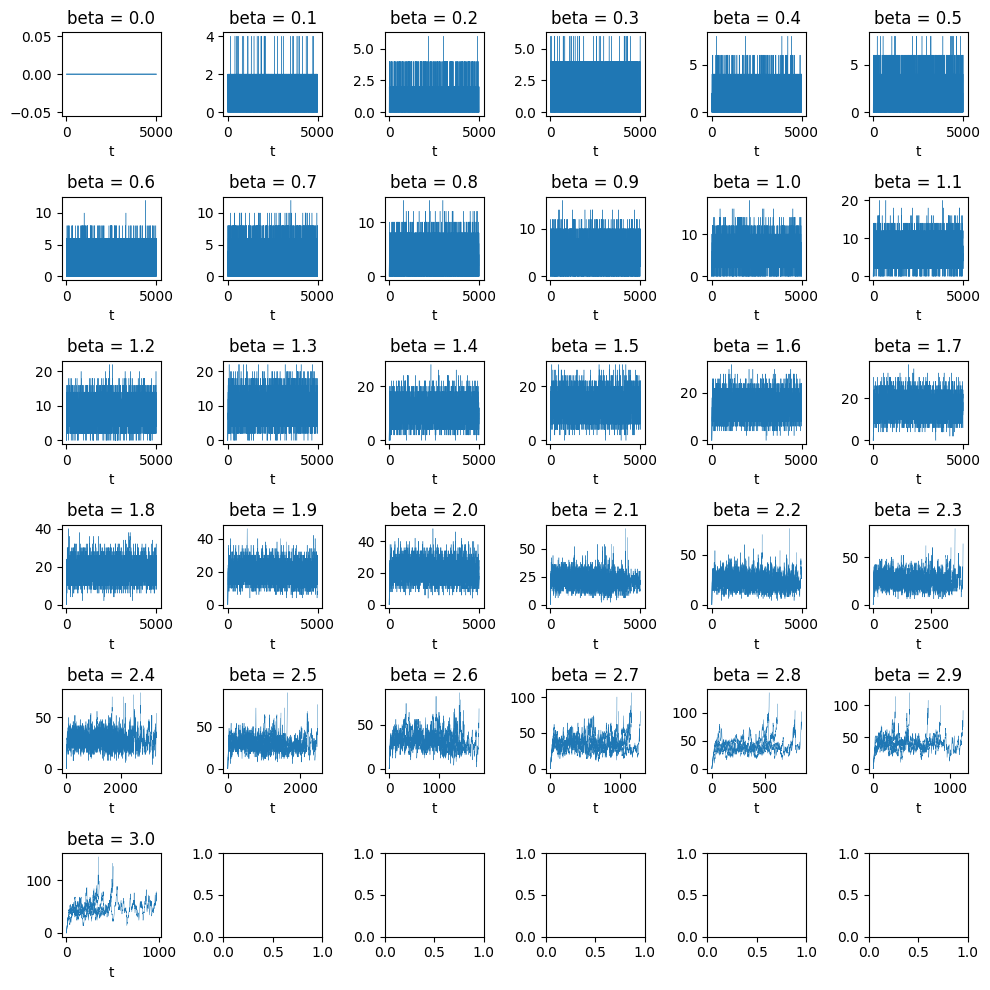

In [22]:
fig, axs = plt.subplots(6,6, figsize=(10,10))
axs = [ax for axlist in axs for ax in axlist]

for i, beta in enumerate(sorted(N_Links_data.keys())):
    for N_Links in N_Links_data[beta]:
        N_Links.plot(x='t', y='N_Links', ax=axs[i], color='tab:blue', legend=False, lw=0.3)
        axs[i].set_title(f'beta = {beta}')
fig.tight_layout()

Similar a los lambda y H

***Abundance of Networks***

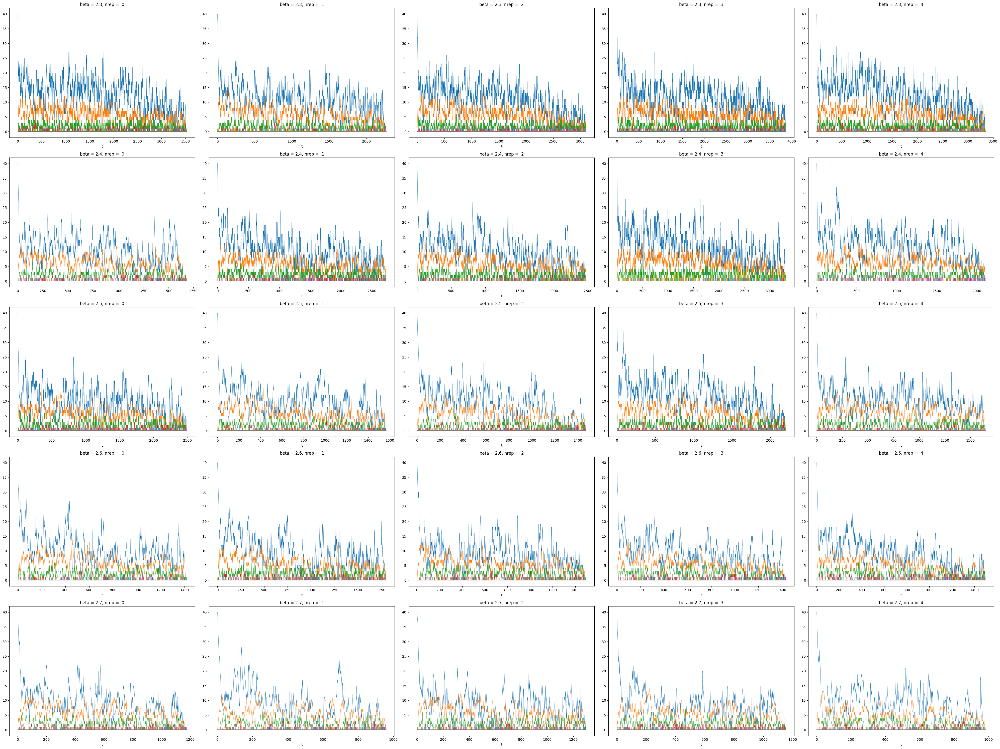

In [28]:
fig, axs = plt.subplots(5,5, figsize=(40,30))

for i, beta in enumerate(list(sorted(data.keys()))[23:28]):
    for nrep in range(5):
        plot_data = data[beta][nrep][['t','NRed','NRep']]
        plot_data = plot_data.pivot(index='t', columns='NRed', values='NRep')
        plot_data = plot_data.fillna(0).reset_index()
        plot_data.plot(x='t', legend=False, ax=axs[i][nrep], lw=0.5)
        axs[i][nrep].set_title(f'beta = {beta}, nrep =  {nrep}')
fig.tight_layout()

Plot casi imposible de analizar (la línea de cada color es una red, no tienen porque ser las mismas entre paneles, aunque en general la azul es el nodo suelto, la naranja el doble nodo, ...)

Si que se puede apreciar que incluso para betas muy altos la gran mayoria de redes son los nodos sueltos, las de 2 nodos y las de 3 nodos, y no suele haber más de 1 o 2 redes más complejas de 5 nodos hasta que se produce el colapso???

***All Measures***

Normalizadas con min=0 y max=1 para que sean todas comparables a la vez, pero no me convence demasiado, no se ve muy bien

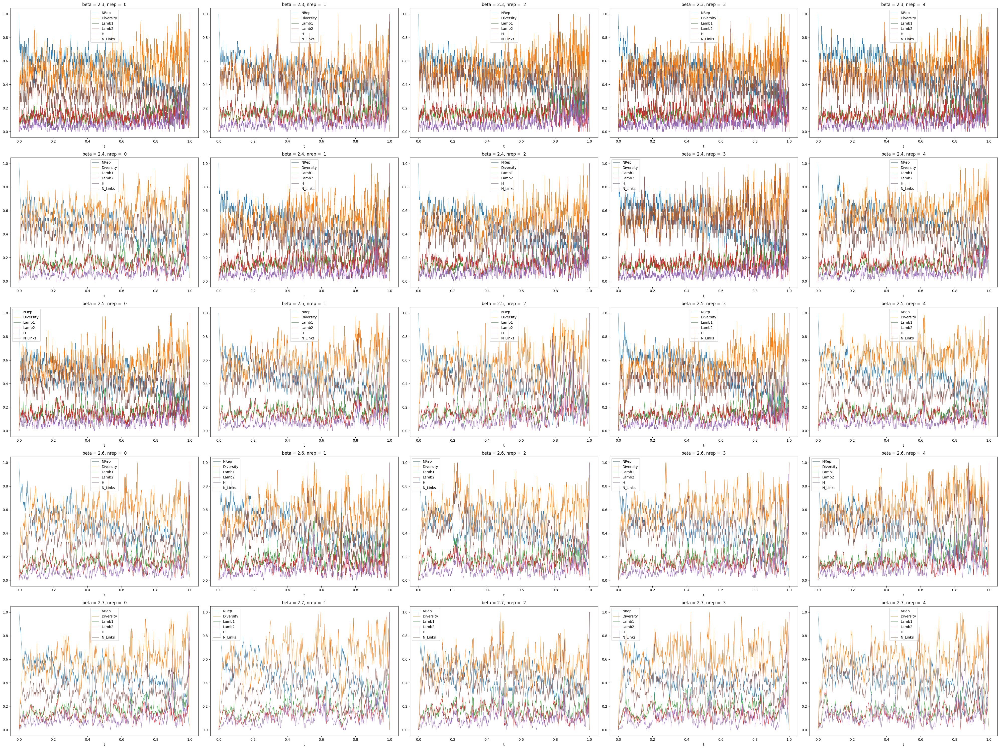

In [10]:
fig, axs = plt.subplots(5,5, figsize=(40,30))

for i, beta in enumerate(list(sorted(data.keys()))[23:28]):
    for nrep in range(5):
        plot_data = num_net_data[beta][nrep][['t','NRep']]
        plot_data = plot_data.merge(diversity_data[beta][nrep][['t','Diversity']], on='t')
        plot_data = plot_data.merge(lamb1_data[beta][nrep][['t','Lamb1']], on='t')
        plot_data = plot_data.merge(lamb2_data[beta][nrep][['t','Lamb2']], on='t')
        plot_data = plot_data.merge(H_data[beta][nrep][['t','H']], on='t')
        plot_data = plot_data.merge(N_Links_data[beta][nrep][['t','N_Links']], on='t')
        plot_data[:] = MinMaxScaler().fit_transform(plot_data)
        plot_data.plot(x='t', ax=axs[i][nrep], lw=0.5)
        axs[i][nrep].set_title(f'beta = {beta}, nrep =  {nrep}')
fig.tight_layout()

***$\beta = 1.4$***

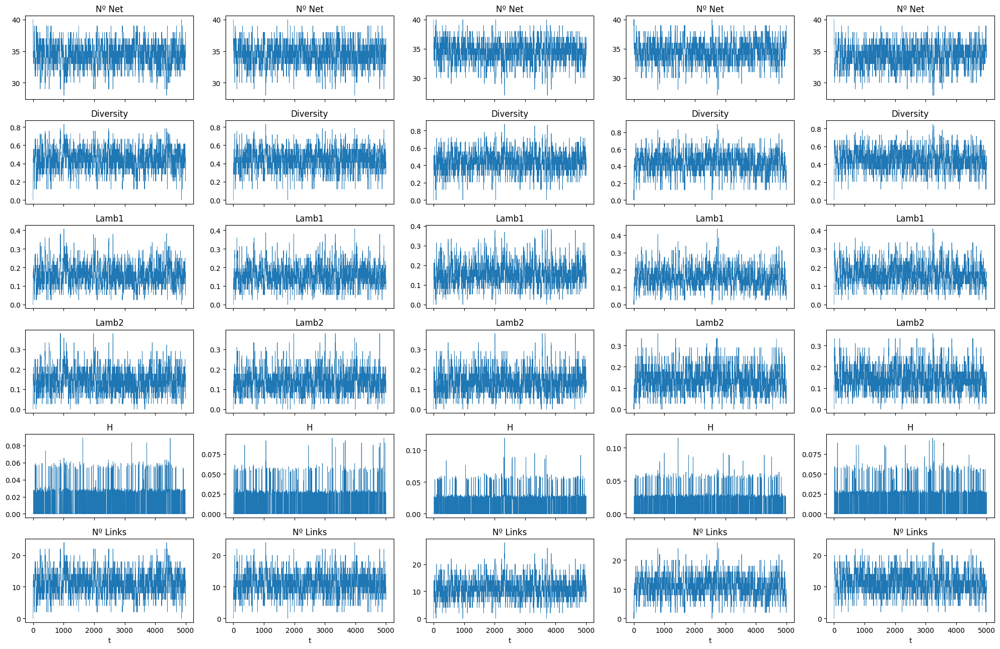

In [11]:
fig, axs = plt.subplots(6,5, figsize=(20,13), sharex=True)

beta = 1.4

for nrep in range(5):
    num_net_data[beta][nrep].plot(x='t', y='NRep', legend=False, ax=axs[0][nrep], lw=0.5)
    axs[0][nrep].set_title(f'Nº Net')
    diversity_data[beta][nrep].plot(x='t', y='Diversity', legend=False, ax=axs[1][nrep], lw=0.5)
    axs[1][nrep].set_title(f'Diversity')
    lamb1_data[beta][nrep].plot(x='t', y='Lamb1', legend=False, ax=axs[2][nrep], lw=0.5)
    axs[2][nrep].set_title(f'Lamb1')
    lamb2_data[beta][nrep].plot(x='t', y='Lamb2', legend=False, ax=axs[3][nrep], lw=0.5)
    axs[3][nrep].set_title(f'Lamb2')
    H_data[beta][nrep].plot(x='t', y='H', legend=False, ax=axs[4][nrep], lw=0.5)
    axs[4][nrep].set_title(f'H')
    N_Links_data[beta][nrep].plot(x='t', y='N_Links', legend=False, ax=axs[5][nrep], lw=0.5)
    axs[5][nrep].set_title(f'Nº Links')
fig.tight_layout()

Con un beta demasiado bajo parece todo un proceso estocástico plano y sin mucha actividad.

Se debe alcanzar un estado estacionario con una distribución relativamente estable de nodos sueltos, pares y trios, y luego irán apareciendo y desapareciendo algunas redes de unos pocos nodos más

***$\beta = 2$***

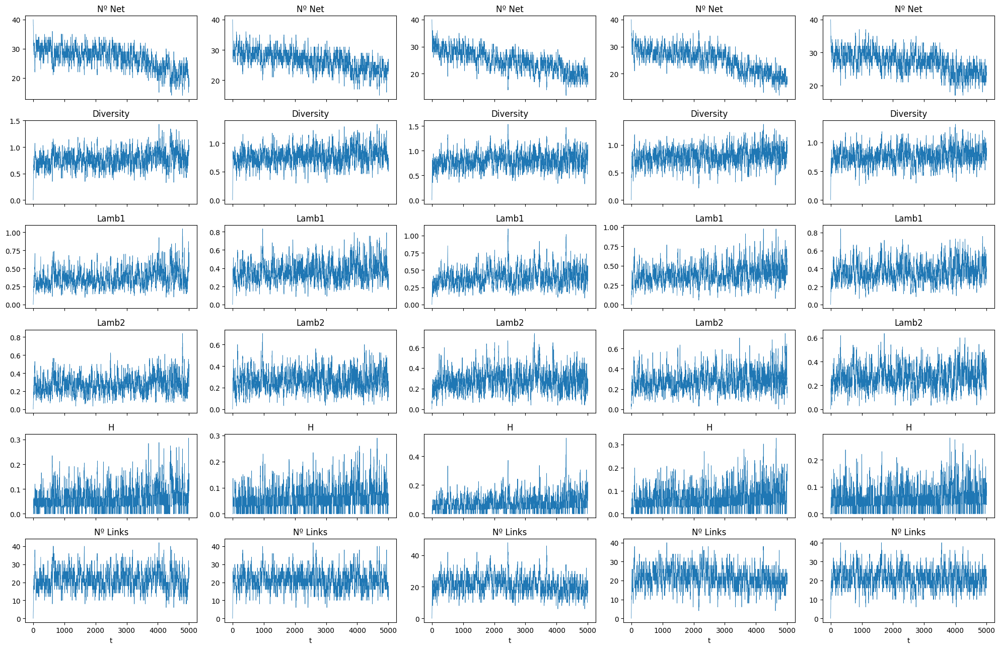

In [12]:
fig, axs = plt.subplots(6,5, figsize=(20,13), sharex=True)

beta = 2

for nrep in range(5):
    num_net_data[beta][nrep].plot(x='t', y='NRep', legend=False, ax=axs[0][nrep], lw=0.5)
    axs[0][nrep].set_title(f'Nº Net')
    diversity_data[beta][nrep].plot(x='t', y='Diversity', legend=False, ax=axs[1][nrep], lw=0.5)
    axs[1][nrep].set_title(f'Diversity')
    lamb1_data[beta][nrep].plot(x='t', y='Lamb1', legend=False, ax=axs[2][nrep], lw=0.5)
    axs[2][nrep].set_title(f'Lamb1')
    lamb2_data[beta][nrep].plot(x='t', y='Lamb2', legend=False, ax=axs[3][nrep], lw=0.5)
    axs[3][nrep].set_title(f'Lamb2')
    H_data[beta][nrep].plot(x='t', y='H', legend=False, ax=axs[4][nrep], lw=0.5)
    axs[4][nrep].set_title(f'H')
    N_Links_data[beta][nrep].plot(x='t', y='N_Links', legend=False, ax=axs[5][nrep], lw=0.5)
    axs[5][nrep].set_title(f'Nº Links')
fig.tight_layout()

Con beta un poco más alta hay cierta tendencia aunque en este caso no tenia puntos temporales suficientes para ver todo el camino 

***$\beta = 2.6$***

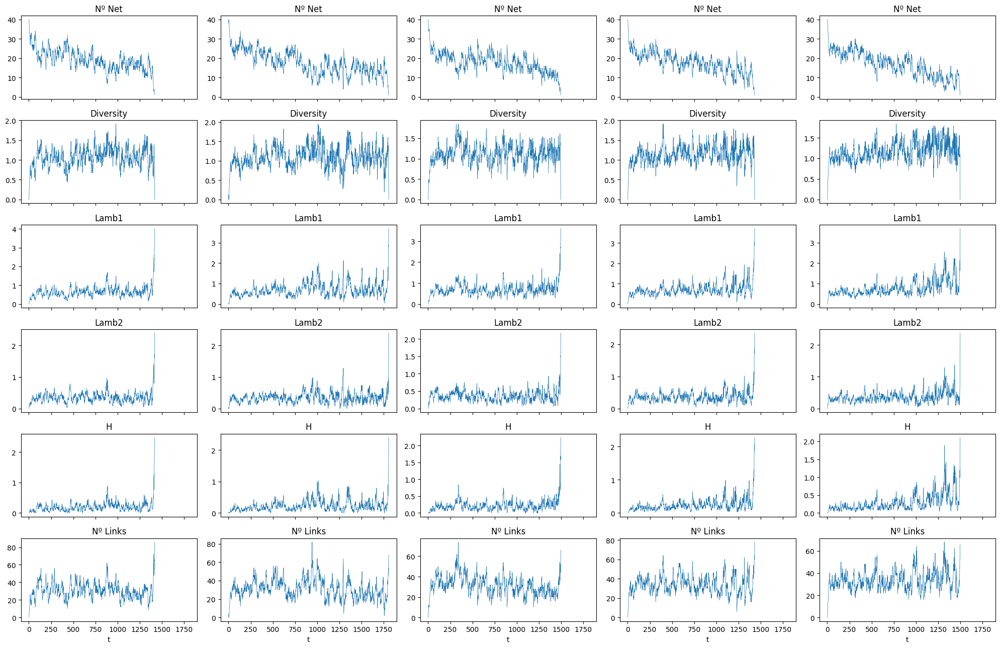

In [13]:
fig, axs = plt.subplots(6,5, figsize=(20,13), sharex=True)

beta = 2.6

for nrep in range(5):
    num_net_data[beta][nrep].plot(x='t', y='NRep', legend=False, ax=axs[0][nrep], lw=0.5)
    axs[0][nrep].set_title(f'Nº Net')
    diversity_data[beta][nrep].plot(x='t', y='Diversity', legend=False, ax=axs[1][nrep], lw=0.5)
    axs[1][nrep].set_title(f'Diversity')
    lamb1_data[beta][nrep].plot(x='t', y='Lamb1', legend=False, ax=axs[2][nrep], lw=0.5)
    axs[2][nrep].set_title(f'Lamb1')
    lamb2_data[beta][nrep].plot(x='t', y='Lamb2', legend=False, ax=axs[3][nrep], lw=0.5)
    axs[3][nrep].set_title(f'Lamb2')
    H_data[beta][nrep].plot(x='t', y='H', legend=False, ax=axs[4][nrep], lw=0.5)
    axs[4][nrep].set_title(f'H')
    N_Links_data[beta][nrep].plot(x='t', y='N_Links', legend=False, ax=axs[5][nrep], lw=0.5)
    axs[5][nrep].set_title(f'Nº Links')
fig.tight_layout()

Con beta suficientemente alto se observa el colapso a una sola red en general y como coinciden los cambios drásticos en todas las medidas a la vez

### 2.2 Analysis of abundance

***$\beta = 1.4$***

In [49]:
file = '../data/N40_Beta1.4_TMax5000_Rep1_alt.mat'
sim_data = load_processed_networld(file)
networks = sim_data['Networks_Unique']
networks_time = sim_data['Networks_Time']
networks_time = networks_time.pivot(index='t', columns='NRed', values='NRep')
networks_time = networks_time.fillna(0).reset_index()

network_ids = networks_time.columns[1:]
len(network_ids)

8

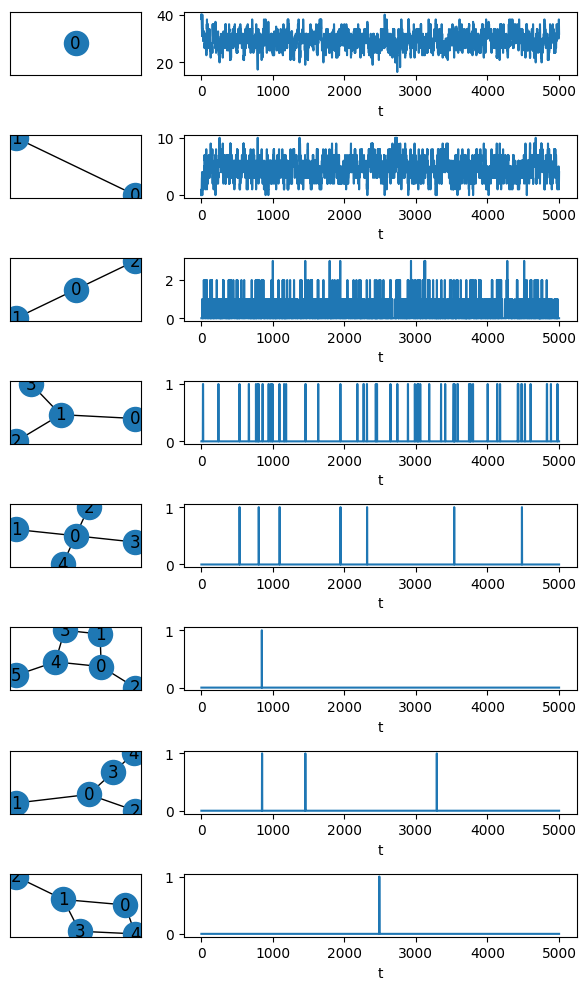

In [50]:
fig, axs = plt.subplots(len(network_ids), 2, figsize=(6,10), gridspec_kw={'width_ratios': [1, 3]})

for id in network_ids:
    G = nx.Graph(networks[int(id)])
    nx.draw_networkx(G, ax=axs[int(id),0], pos=nx.spring_layout(G))
    networks_time.plot(x='t',y=id, legend=False, ax=axs[int(id),1])
fig.tight_layout()

Como se comentaba, con beta = 1.4 el crecimiento es tan dificil que las 3 redes básicas ocupan casi el total de la distribución en cualquier punto de tiempo, y solo hay espacio para otra red un poco más grande (aquí 5-6 nodos) que va cambiando entre unas pocas alternativas con el tiempo

In [51]:
file = '../data/N40_Beta1.4_TMax5000_Rep2_alt.mat'
sim_data = load_processed_networld(file)
networks = sim_data['Networks_Unique']
networks_time = sim_data['Networks_Time']
networks_time = networks_time.pivot(index='t', columns='NRed', values='NRep')
networks_time = networks_time.fillna(0).reset_index()

network_ids = networks_time.columns[1:]
len(network_ids)

9

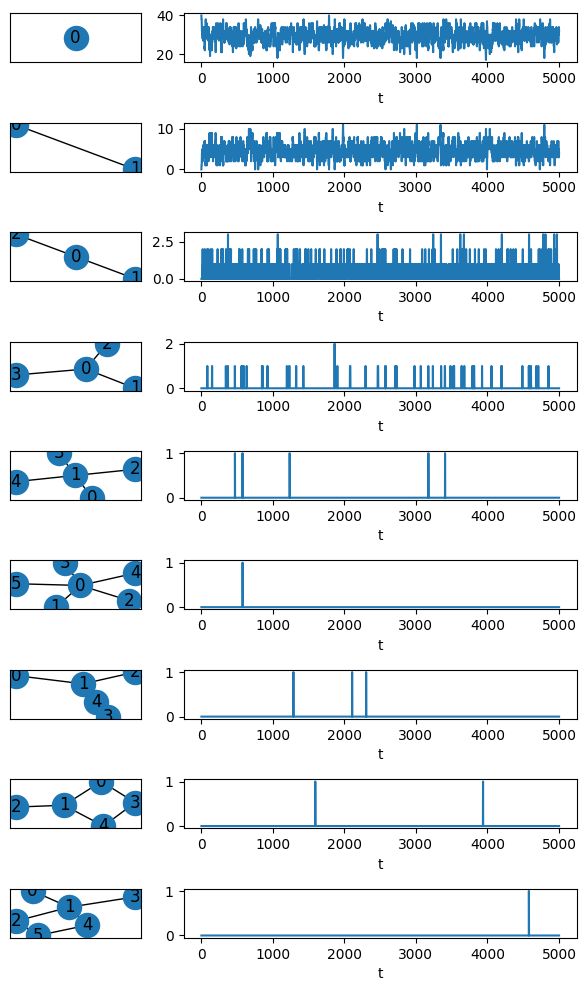

In [52]:
fig, axs = plt.subplots(len(network_ids), 2, figsize=(6,10), gridspec_kw={'width_ratios': [1, 3]})

for id in network_ids:
    G = nx.Graph(networks[int(id)])
    nx.draw_networkx(G, ax=axs[int(id),0], pos=nx.spring_layout(G))
    networks_time.plot(x='t',y=id, legend=False, ax=axs[int(id),1])
fig.tight_layout()

Otra repetición. Es básicamente igual.

***$\beta = 2$***

In [43]:
file = '../data/N40_Beta2_TMax5000_Rep1_alt.mat'
sim_data = load_processed_networld(file)
networks = sim_data['Networks_Unique']
networks_time = sim_data['Networks_Time']
networks_time = networks_time.pivot(index='t', columns='NRed', values='NRep')
networks_time = networks_time.fillna(0).reset_index()

network_ids = networks_time.columns[1:]
len(network_ids)

28

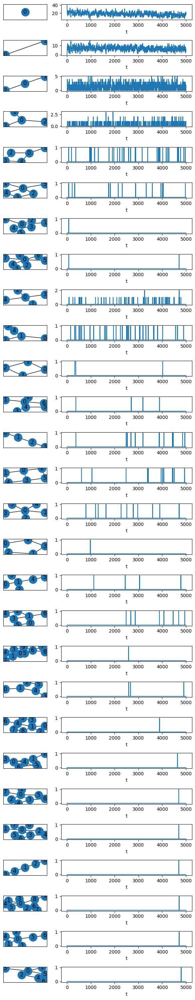

In [47]:
fig, axs = plt.subplots(len(network_ids), 2, figsize=(6,30), gridspec_kw={'width_ratios': [1, 3]})

for id in network_ids:
    G = nx.Graph(networks[int(id)])
    nx.draw_networkx(G, ax=axs[int(id),0], pos=nx.spring_layout(G))
    networks_time.plot(x='t',y=id, legend=False, ax=axs[int(id),1])
fig.tight_layout()

Con este beta más alto aparecen más redes nuevas pero casi todos los nodos siguen estando en redes muy simples. Debe haber unos 30 nodos ocupados por nodos sueltos y parejas durante casi toda la simulación y solo queda espacio para una o dos redes más grandes

***$\beta = 2.6$***

In [53]:
file = '../data/N40_Beta2.6_TMax5000_Rep1_alt.mat'
sim_data = load_processed_networld(file)
networks = sim_data['Networks_Unique']
networks_time = sim_data['Networks_Time']
networks_time = networks_time.pivot(index='t', columns='NRed', values='NRep')
networks_time = networks_time.fillna(0).reset_index()

network_ids = networks_time.columns[1:]
len(network_ids)

144

Como esta vez aparecen 144 redes es completamente imposible dibujarlas, vamos a intentar juntar algunas de las menos abundantes en una categoria "otros"

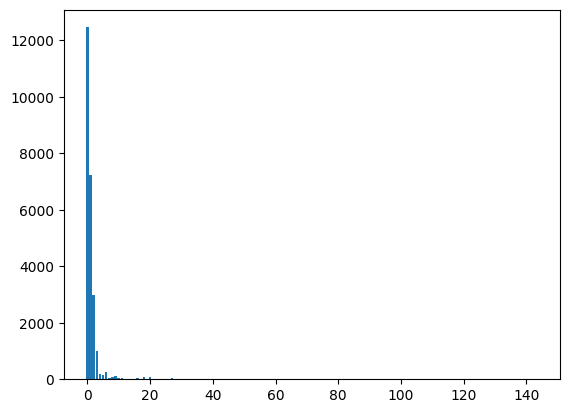

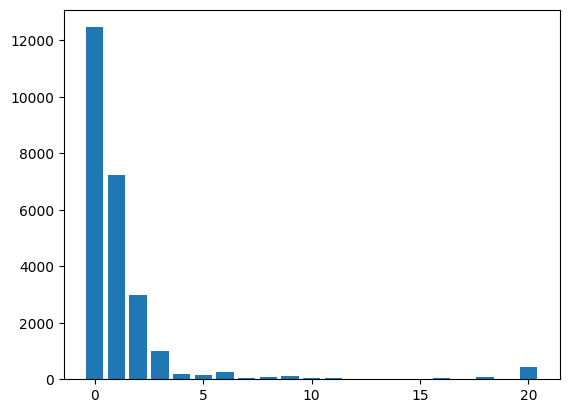

In [71]:
network_occurrences = networks_time[network_ids].sum()
plt.bar(x=network_occurrences.index,height=network_occurrences)
plt.show()

count = sum(network_occurrences[network_ids[network_ids>=20]])
network_occurrences = network_occurrences[network_ids[network_ids<=20]]
network_occurrences[20] = count
plt.bar(x=network_occurrences.index,height=network_occurrences)
plt.show()

0       0.0
1       0.0
2       0.0
3       0.0
4       0.0
       ... 
1493    1.0
1494    1.0
1495    1.0
1496    1.0
1497    1.0
Length: 1498, dtype: float64

La 20 seria el otros

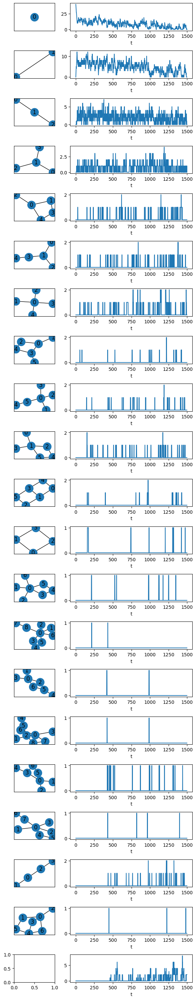

In [78]:
fig, axs = plt.subplots(21, 2, figsize=(6,30), gridspec_kw={'width_ratios': [1, 3]})

for id in range(20):
    G = nx.Graph(networks[int(id)])
    nx.draw_networkx(G, ax=axs[int(id),0], pos=nx.spring_layout(G))
    networks_time.plot(x='t',y=id, legend=False, ax=axs[int(id),1])
networks_time[20] = networks_time[network_ids[network_ids>=20]].sum(axis=1)
networks_time.plot(x='t',y=20, legend=False, ax=axs[20,1])
fig.tight_layout()

## 3. Stationary Process

In [5]:
data_path = '../data/'
data_files = os.listdir(data_path)
data_files = [file for file in data_files if file[:3]=='N50' and file[-7:]=='alt.mat']

In [6]:
data = {}

for file in data_files:
    beta = file.split('_')[1]
    beta = float(beta[4:])
    file = data_path + file
    sim_data = load_processed_networld(file)
    meas_data = sim_data['Networks_Time'].merge(sim_data['Networks_Measures'], how='left', on='NRed')
    if beta in data.keys():
        data[beta].append(meas_data)
    else:
        data[beta] = [meas_data]

#### 2.1.1 Analysis of trayectories

***Number of Networks***

In [7]:
num_net_data = {}

for i, beta in enumerate(sorted(data.keys())):
    beta_num_net = []
    for sim_data in data[beta]:
        num_net = sim_data.groupby('t')['NRep'].sum().reset_index()
        beta_num_net.append(num_net)
    num_net_data[beta] = beta_num_net

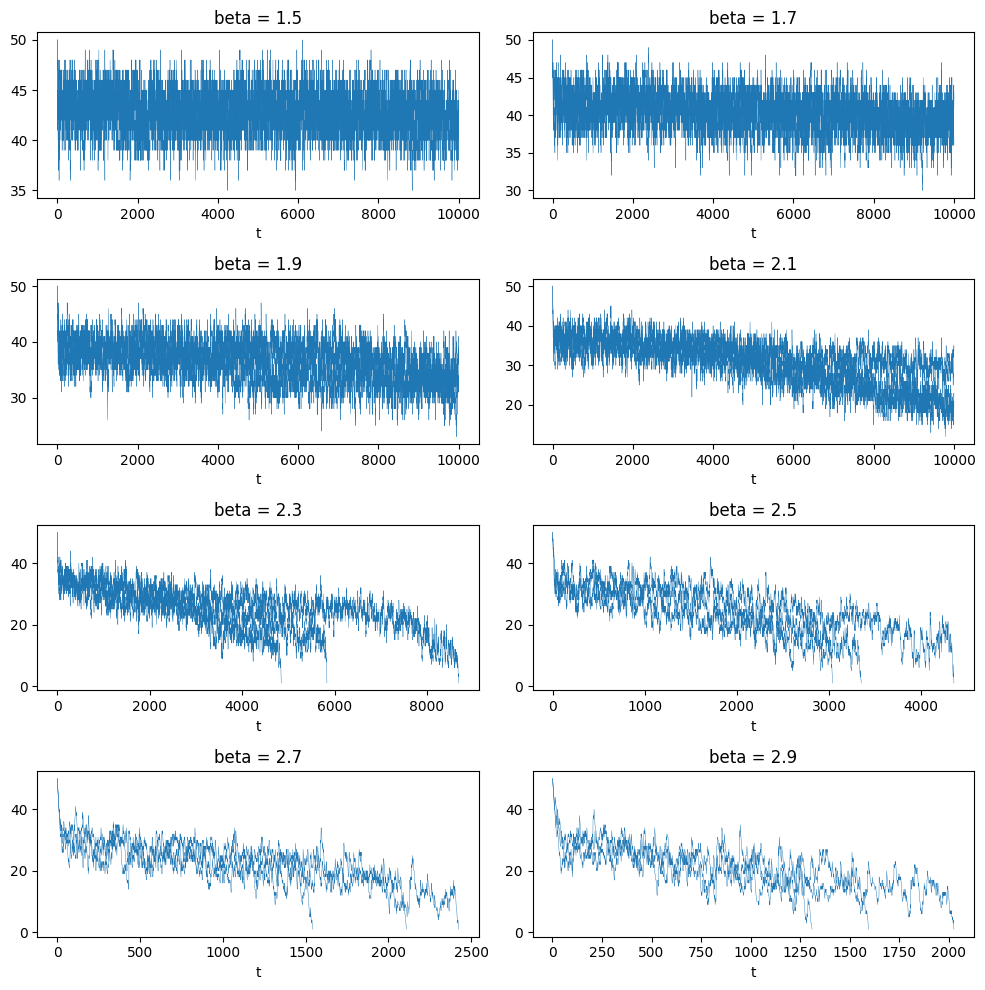

In [9]:
fig, axs = plt.subplots(4,2, figsize=(10,10))
axs = [ax for axlist in axs for ax in axlist]

for i, beta in enumerate(sorted(num_net_data.keys())):
    for num_net in num_net_data[beta]:
        num_net.plot(x='t', y='NRep', ax=axs[i], color='tab:blue', legend=False, lw=0.3)
        axs[i].set_title(f'beta = {beta}')
fig.tight_layout()